<a href="https://colab.research.google.com/github/An-cute/CV/blob/main/Computer-vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

CV - 15/9/2026

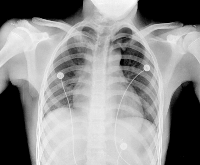

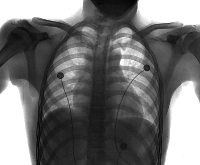

In [4]:
# Image Negative

import cv2
from google.colab.patches import cv2_imshow

img_path = "/content/Xquang phổi.png"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

L = 256
img_neg = L - 1 - img

cv2_imshow(img)
cv2_imshow(img_neg)

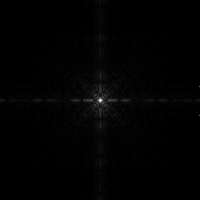

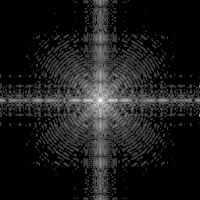

In [5]:
# Log Transformation

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img_path = "/content/DFT_no_log.png"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

c = 255 / np.log(1 + 255)
img_log = np.uint8(c * np.log(1 + img))

cv2_imshow(img)
cv2_imshow(img_log)


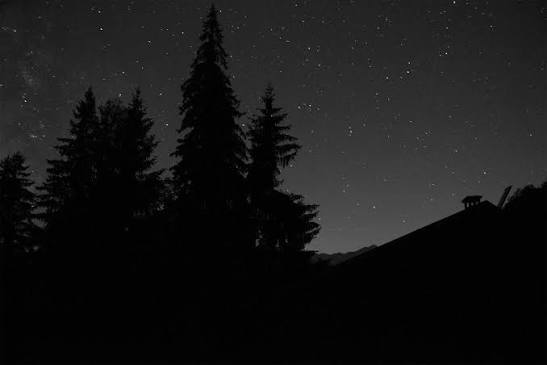

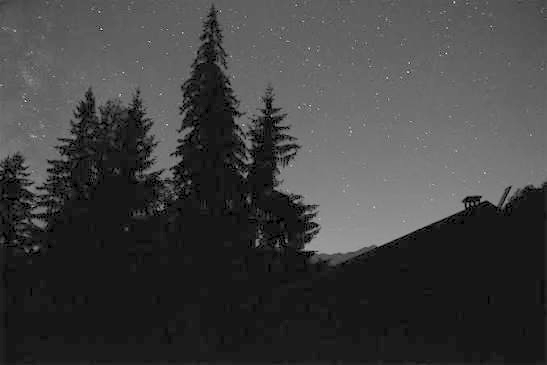

In [9]:
# Power-law (Gamma) Transformation

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
img_path = "/content/Ảnh chụp đêm.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
L = 256
gamma_val_1 = 0.5
img_float = img / (L - 1.0)
img_transformed_1 = np.uint8( (img_float ** gamma_val_1) * (L - 1) )
cv2_imshow(img)
cv2_imshow(img_transformed_1)

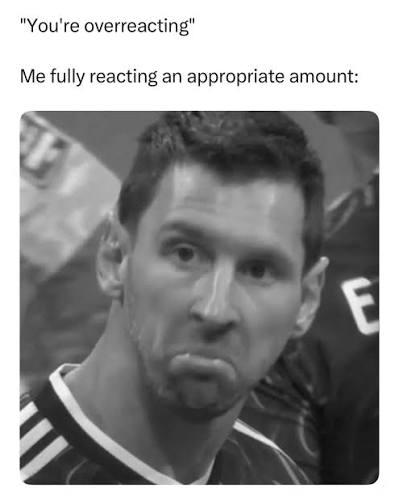

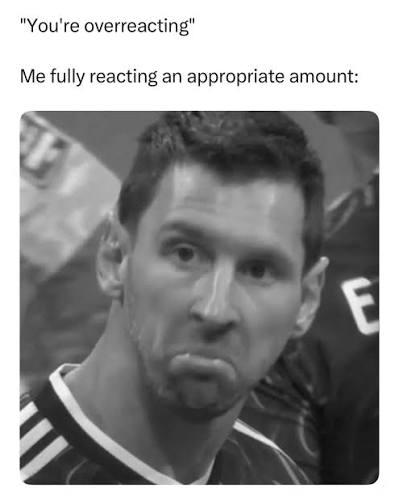

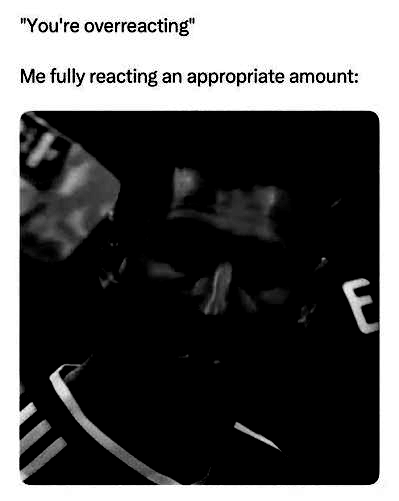

In [24]:
# Contrast Stretching

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
img_path = "/content/images (7).jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
rmin = float(np.min(img))
rmax = float(np.max(img))
rmean = float(np.mean(img))
def ContrastStretching(img, r1, r2, s1, s2):
    slope1 = (s1 / r1) if r1 != 0 else 0.0
    slope2 = ((s2 - s1) / (r2 - r1)) if (r2 - r1) != 0 else 0.0
    slope3 = ((255.0 - s2) / (255.0 - r2)) if (255.0 - r2) != 0 else 0.0
    img_float = img.astype(np.float32)
    cond1 = img_float < r1
    cond2 = (img_float >= r1) & (img_float <= r2)

    out = np.where(cond1, slope1 * img_float,
          np.where(cond2, s1 + slope2 * (img_float - r1),
                          s2 + slope3 * (img_float - r2)))
    return np.clip(np.round(out), 0, 255).astype(np.uint8)
img_contrast = ContrastStretching(img, rmin, rmax, 0, 255)
img_threshold = ContrastStretching(img, rmean, rmax, 0, 255)
cv2_imshow(img)
cv2_imshow(img_contrast)
cv2_imshow(img_threshold)

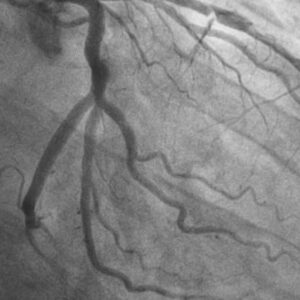

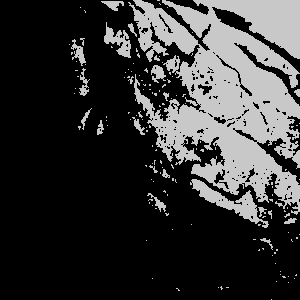

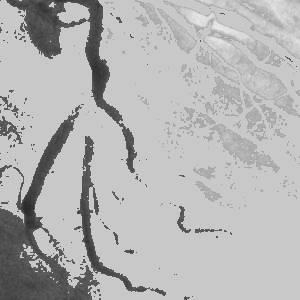

In [14]:
# Intensity-level slicing (Thresholding)

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
img_path = "/content/Machj máu.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
rmean = np.mean(img)
W, N = img.shape
img_slicing_1 = np.zeros((W, N), np.uint8)
img_slicing_2 = img.copy()
for x in range (0,W):
  for y in range (0,N):
    r = img[x, y]
    if (r >= 150) and (r <= 255):
      img_slicing_1[x,y] = 200
    if (r >= (rmean - 35)) and (r <= (rmean + 35)):
      img_slicing_2[x,y] = 200
cv2_imshow(img)
cv2_imshow(img_slicing_1)
cv2_imshow(img_slicing_2)

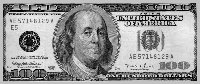

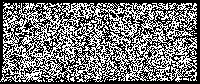

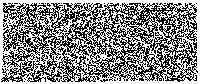

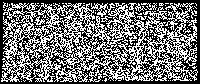

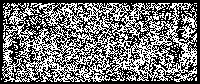

...

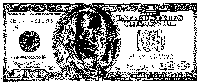

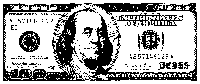

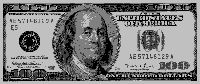

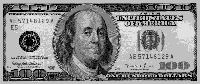

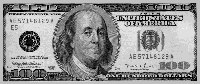

In [ ]:
# Bit-plane slicing

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
img_path = "/content/Fig0314(a)(100-dollars).png"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
W, N = img.shape
bit_plane = [np.zeros((W, N), np.uint8) for _ in range (11)]

for x in range (W):
  for y in range (N):
    r = img[x,y]
    for z in range (8):
      mask = (1<<z)
      bit_value = (r & mask) >> z
      bit_plane[z][x,y] = bit_value * 255
bit_plane[8] = ((bit_plane[7]/255)*2**7 + (bit_plane[6]/255)*2**6).astype(np.uint8)
bit_plane[9] = (bit_plane[8] + bit_plane[5]/255*2**5).astype(np.uint8)
bit_plane[10] = (bit_plane[9] + bit_plane[4]/255*2**4).astype(np.uint8)
cv2_imshow(img)
for z in range (8):
  cv2_imshow(bit_plane[z])
cv2_imshow(bit_plane[8])
cv2_imshow(bit_plane[9])
cv2_imshow(bit_plane[10])

Ảnh gốc | Global Equalization | Local Equalization


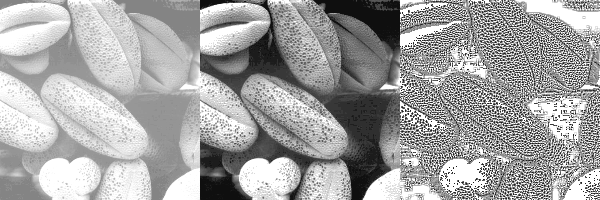

In [ ]:
# Histogram processing

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
img_path = "/content/Fig0316(1)(top_left).png"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

def HistogramEqualization(image):
    H, W = image.shape
    hr = np.bincount(image.flatten(), minlength=256)
    pr = hr / (H * W)
    hr_eq = np.cumsum(pr)
    lut = np.clip(np.round(255 * hr_eq), 0, 255).astype(np.uint8)
    return lut[image]
global_histeq_img = HistogramEqualization(img)
kernel_size = 3
pad = kernel_size // 2
H, W = img.shape
local_histeq_img = img.copy()
padded_img = cv2.copyMakeBorder(img, pad, pad, pad, pad, cv2.BORDER_REFLECT)
for x in range(H):
    for y in range(W):
        w = padded_img[x : x + kernel_size, y : y + kernel_size]
        w_eq = HistogramEqualization(w)
        local_histeq_img[x, y] = w_eq[pad, pad]
print("Ảnh gốc | Global Equalization | Local Equalization")
combined = np.hstack((img, global_histeq_img, local_histeq_img))
cv2_imshow(combined)

CV - 28/8/2026

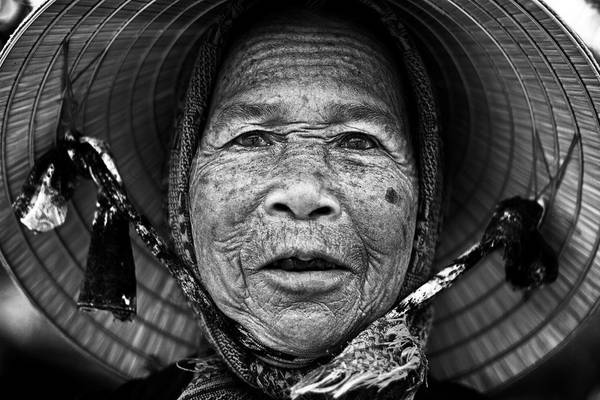

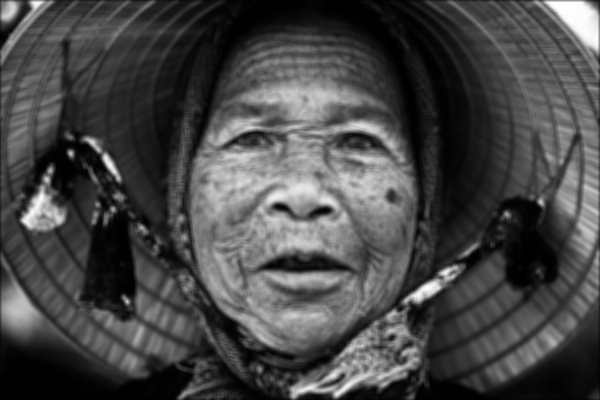

In [15]:
# Averaging filters

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
img_path = "/content/Bà cụ.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
k = 5
a = k // 2
img_pad = np.pad(img, a, mode = "constant", constant_values = 0)
H, W = img.shape
img_out = np.zeros((H, W), np.uint8)
for y in range(H):
  for x in range(W):
    total = 0
    for s in range (-a, a+1):
      for t in range (-a, a+1):
        total += int(img_pad[y+a+s, x+a+t])
    img_out[y, x] = total // (k * k)
cv2_imshow(img)
cv2_imshow(img_out)

Ảnh chụp X-quang bị nhiễu bởi hạt muối tiêu | Giảm nhiễu bằng bộ lọc trung bình | Giảm nhiễu bằng bộ lọc trung vị


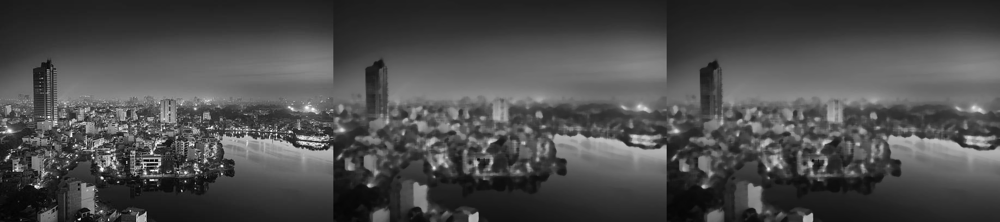

In [22]:
# Median filters

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
img_path = "/content/City.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
# Cách 1: Tự cài đặt thuật toán Median Filter
def median_filter(image, kernel_size=3):
    H, W = image.shape
    pad = kernel_size // 4
    padded_img = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REFLECT)
    filtered_img = np.zeros_like(image)
    for x in range(H):
        for y in range(W):
            window = padded_img[x : x + kernel_size, y : y + kernel_size]
            filtered_img[x, y] = np.median(window)
    return filtered_img
# Cách 2: Sử dụng hàm tối ưu sẵn của OpenCV
ksize = 7
custom_median = median_filter(img, kernel_size=ksize)
cv2_median = cv2.medianBlur(img, ksize)
print("Ảnh chụp X-quang bị nhiễu bởi hạt muối tiêu | Giảm nhiễu bằng bộ lọc trung bình | Giảm nhiễu bằng bộ lọc trung vị")
combined = np.hstack((img, custom_median, cv2_median))
cv2_imshow(combined)

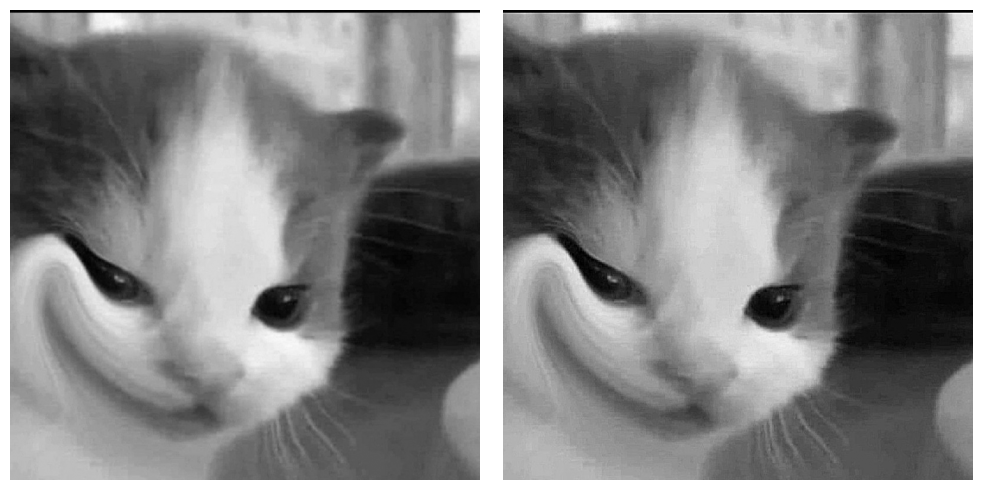

In [28]:
# Unsharp Masking:

import cv2
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("/content/Hinh-meme-meo-cuoi-deu-2.jpg", cv2.IMREAD_GRAYSCALE)
img_f = img.astype(np.float32)
k = 5
kernel = np.ones((k, k), np.float32) / (k * k)
img_blur = cv2.filter2D(img_f, -1, kernel)
mask = img_f - img_blur
k_sharp = 1.0
sharp = img_f + k_sharp * mask
mask_display = cv2.normalize(mask, None, 0, 255, cv2.NORM_MINMAX)
sharp_display = np.clip(sharp, 0, 255).astype(np.uint8)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(sharp_display, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

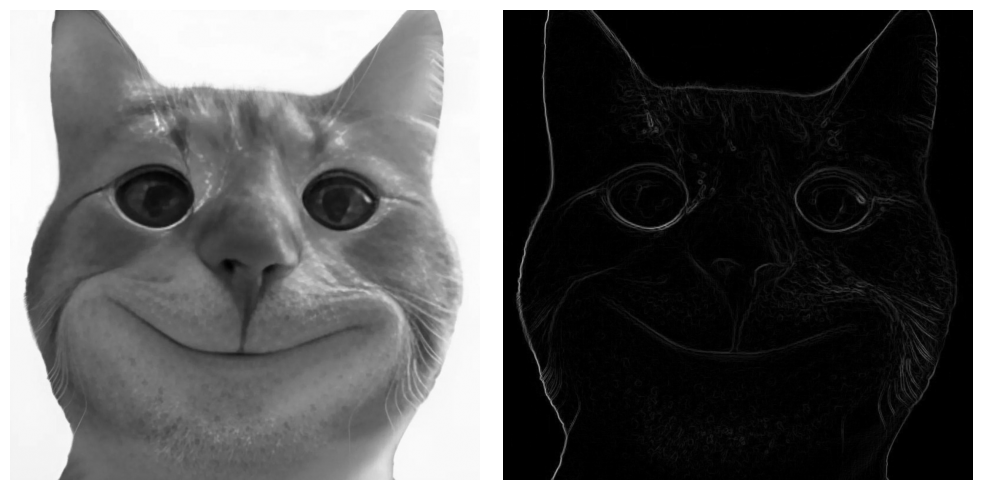

In [29]:
# Robert

import cv2
import matplotlib.pyplot as plt
import numpy as np
img = cv2.imread("/content/Hinh-meme-meo-cuoi-deu-1.jpg", cv2.IMREAD_GRAYSCALE)
img_f = img.astype(np.float32)
roberts_x = np.array([[ 1,  0],
                      [ 0, -1]], dtype=np.float32)
roberts_y = np.array([[ 0,  1],
                      [-1,  0]], dtype=np.float32)
gx = cv2.filter2D(img_f, -1, roberts_x)
gy = cv2.filter2D(img_f, -1, roberts_y)
roberts_edge = np.sqrt(gx**2 + gy**2)
edge_display = np.clip(roberts_edge, 0, 255).astype(np.uint8)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(edge_display, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

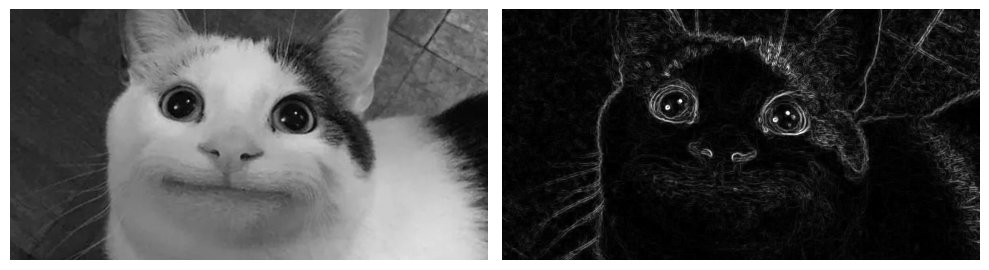

In [30]:
#Sobel

import cv2
import matplotlib.pyplot as plt
import numpy as np
img = cv2.imread("/content/anh-27-meme-dang-yeu-didongmy.jpg", cv2.IMREAD_GRAYSCALE)
img_f = img.astype(np.float32)
sobel_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
], dtype=np.float32)
sobel_y = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float32)
gx = cv2.filter2D(img_f, -1, sobel_x)
gy = cv2.filter2D(img_f, -1, sobel_y)
sobel_edge = np.sqrt(gx**2 + gy**2)
edge_display = np.clip(sobel_edge, 0, 255).astype(np.uint8)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(edge_display, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

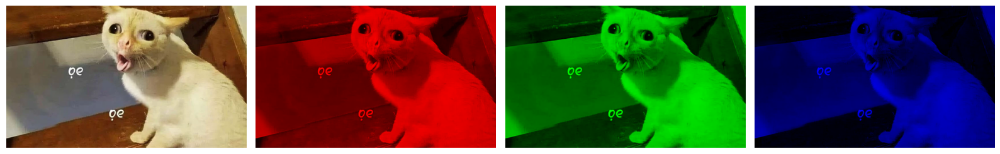

In [31]:
# RGB:

import cv2
import matplotlib.pyplot as plt
import numpy as np
img_bgr = cv2.imread("/content/anh-meme-7.webp")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
R, G, B = cv2.split(img_rgb)
zeros = np.zeros_like(R)
only_R = cv2.merge([R, zeros, zeros])
only_G = cv2.merge([zeros, G, zeros])
only_B = cv2.merge([zeros, zeros, B])
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.imshow(img_rgb)
plt.axis("off")
plt.subplot(1, 4, 2)
plt.imshow(only_R)
plt.axis("off")
plt.subplot(1, 4, 3)
plt.imshow(only_G)
plt.axis("off")
plt.subplot(1, 4, 4)
plt.imshow(only_B)
plt.axis("off")
plt.tight_layout()
plt.show()

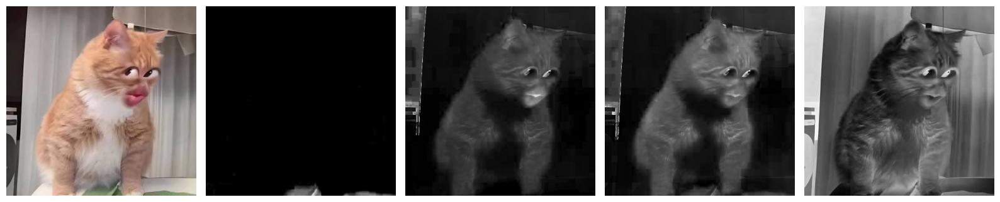

In [33]:
# CMY/CMYK

import cv2
import matplotlib.pyplot as plt
import numpy as np
img_bgr = cv2.imread("/content/images (2).jpg")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
R = img_rgb[:, :, 0]
G = img_rgb[:, :, 1]
B = img_rgb[:, :, 2]
C_raw = 1.0 - R
M_raw = 1.0 - G
Y_raw = 1.0 - B
K = np.minimum(np.minimum(C_raw, M_raw), Y_raw)
epsilon = 1e-7
C = (C_raw - K) / (1.0 - K + epsilon)
M = (M_raw - K) / (1.0 - K + epsilon)
Y = (Y_raw - K) / (1.0 - K + epsilon)
plt.figure(figsize=(16, 4))
plt.subplot(1, 5, 1)
plt.imshow(img_rgb)
plt.axis("off")
plt.subplot(1, 5, 2)
plt.imshow(C, cmap="gray")
plt.axis("off")
plt.subplot(1, 5, 3)
plt.imshow(M, cmap="gray")
plt.axis("off")
plt.subplot(1, 5, 4)
plt.imshow(Y, cmap="gray")
plt.axis("off")
plt.subplot(1, 5, 5)
plt.imshow(K, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

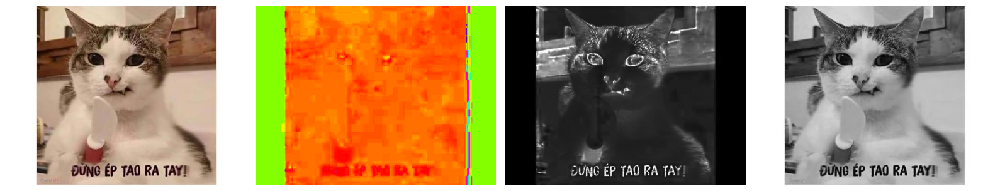

In [34]:
#HSI:

import cv2
import matplotlib.pyplot as plt
import numpy as np
img_bgr = cv2.imread("/content/images (3).jpg")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
R = img_rgb[:, :, 0]
G = img_rgb[:, :, 1]
B = img_rgb[:, :, 2]
I = (R + G + B) / 3.0
min_rgb = np.minimum(np.minimum(R, G), B)
sum_rgb = R + G + B
eps = 1e-6
S = 1.0 - (3.0 / (sum_rgb + eps)) * min_rgb
S[sum_rgb == 0] = 0.0
num = 0.5 * ((R - G) + (R - B))
den = np.sqrt((R - G) ** 2 + (R - B) * (G - B)) + eps
theta = np.arccos(np.clip(num / den, -1.0, 1.0))
H = theta
H[B > G] = 2 * np.pi - H[B > G]
H = H / (2 * np.pi)
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.imshow(img_rgb)
plt.axis("off")
plt.subplot(1, 4, 2)
plt.imshow(H, cmap="hsv")
plt.axis("off")
plt.subplot(1, 4, 3)
plt.imshow(S, cmap="gray")
plt.axis("off")
plt.subplot(1, 4, 4)
plt.imshow(I, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

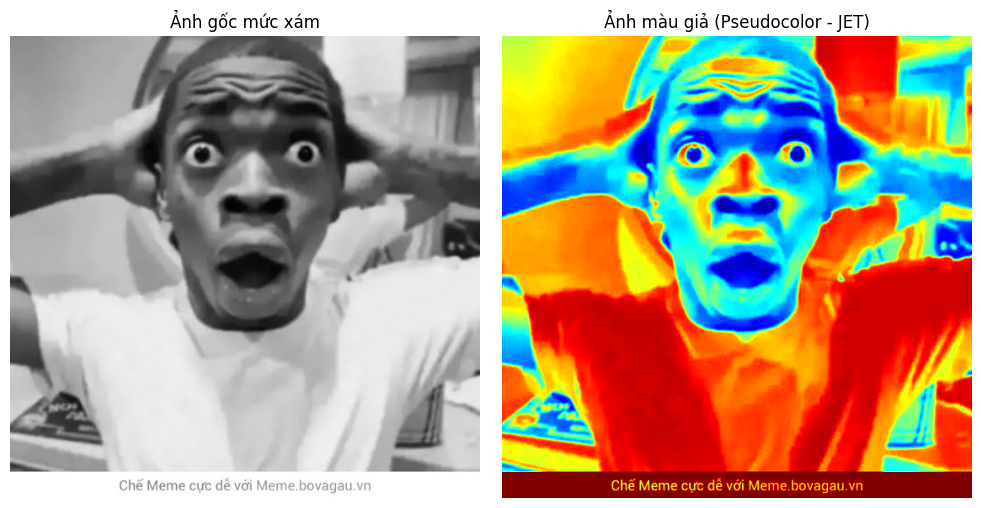

In [35]:
# Pseudocolor:

import cv2
import matplotlib.pyplot as plt
img_gray = cv2.imread("/content/images (4).jpg", cv2.IMREAD_GRAYSCALE)
img_pseudocolor = cv2.applyColorMap(img_gray, cv2.COLORMAP_JET)
img_pseudocolor_rgb = cv2.cvtColor(img_pseudocolor, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Ảnh gốc mức xám")
plt.imshow(img_gray, cmap="gray")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Ảnh màu giả (Pseudocolor - JET)")
plt.imshow(img_pseudocolor_rgb)
plt.axis("off")
plt.tight_layout()
plt.show()

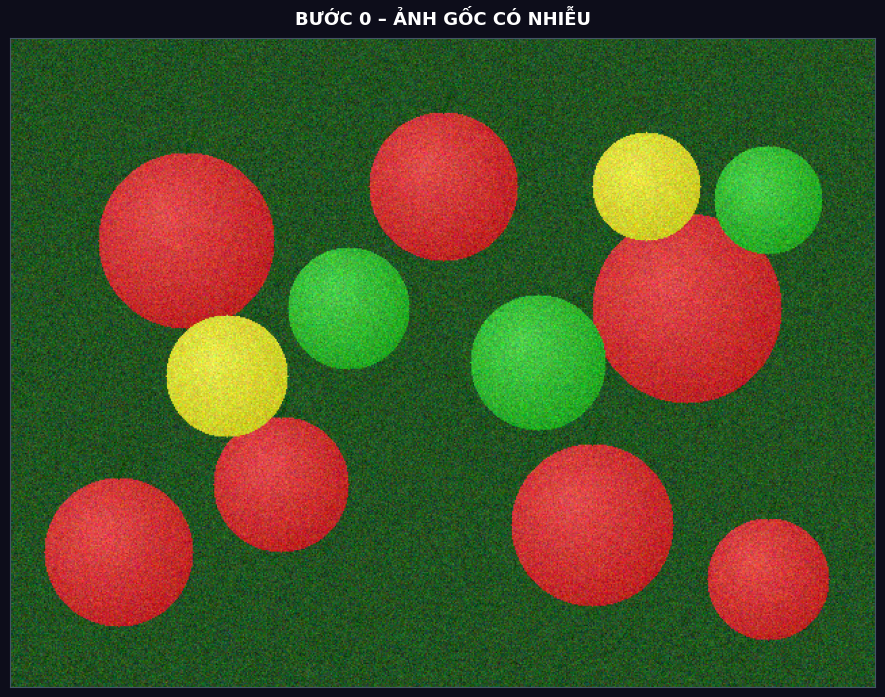

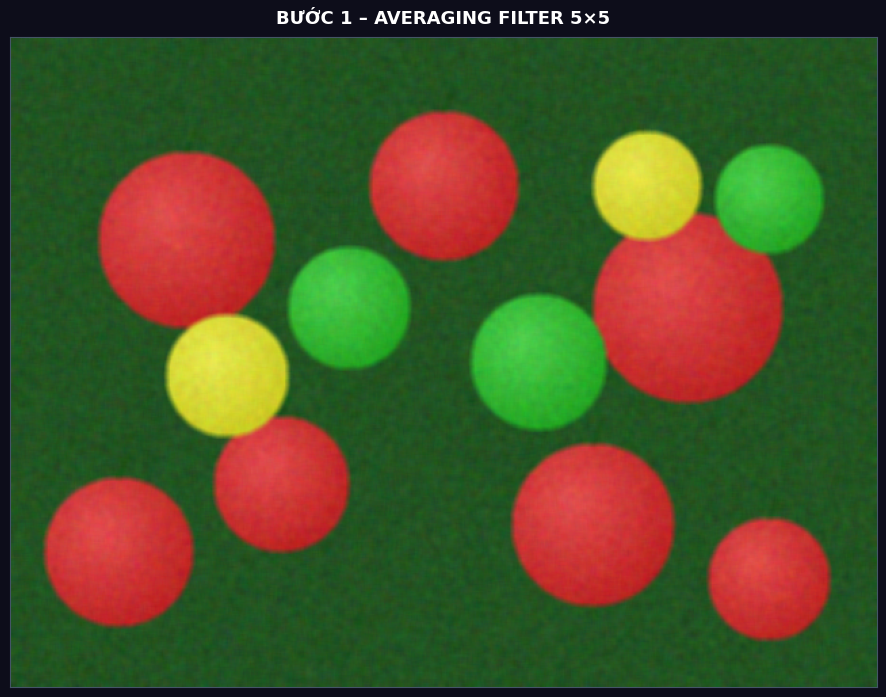

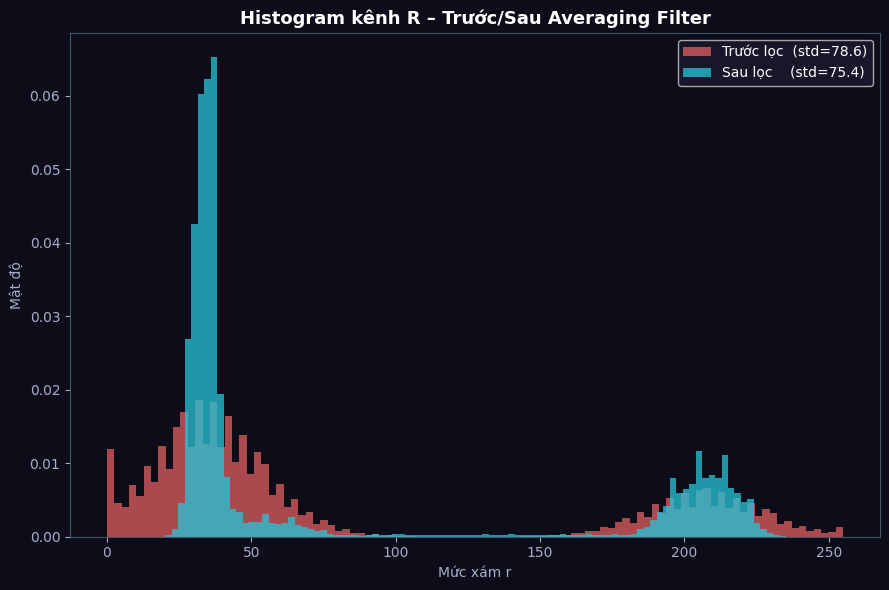

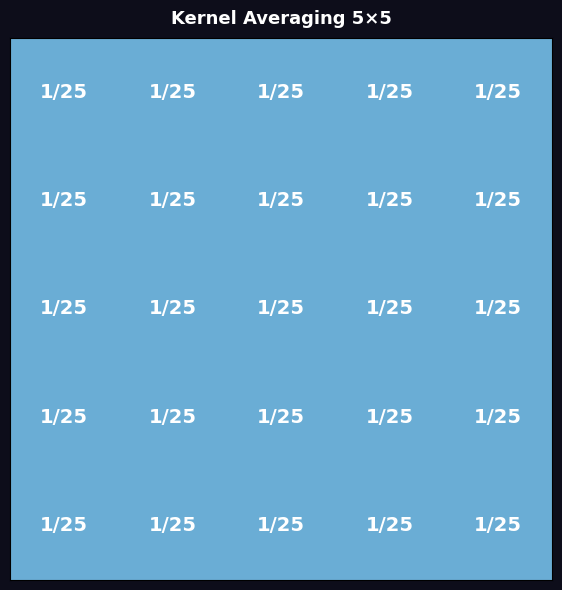

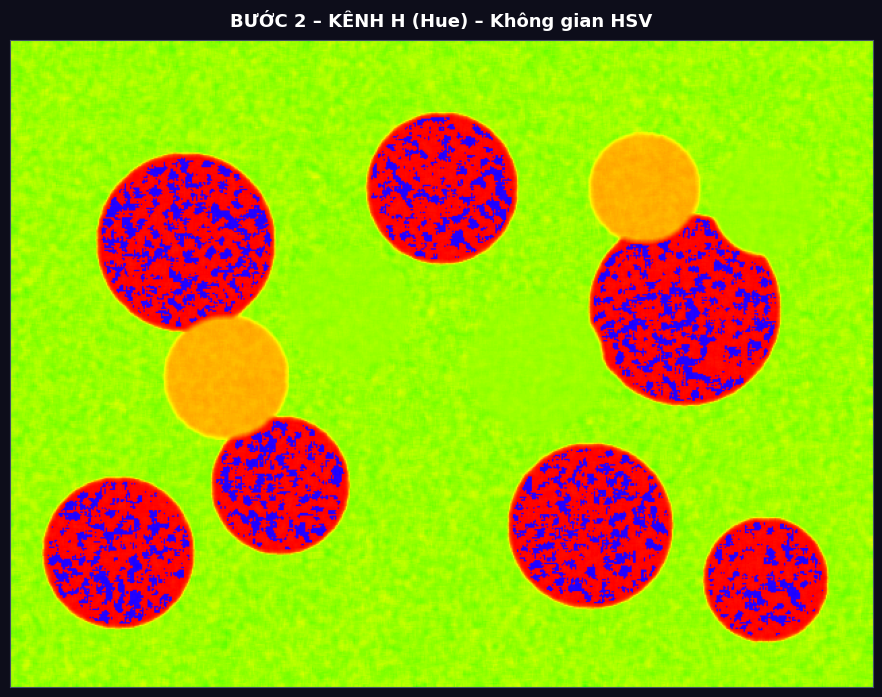

...

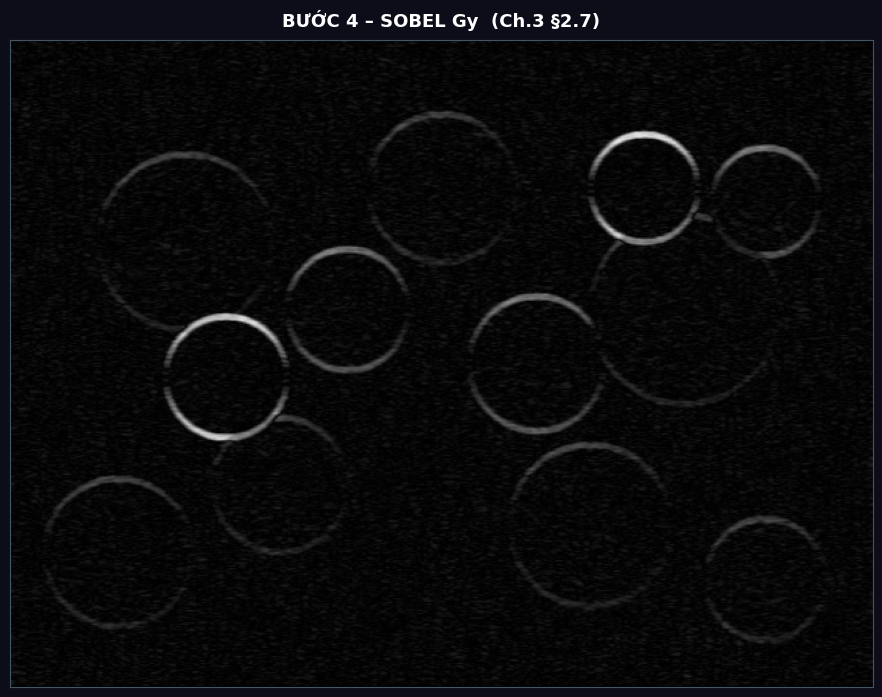

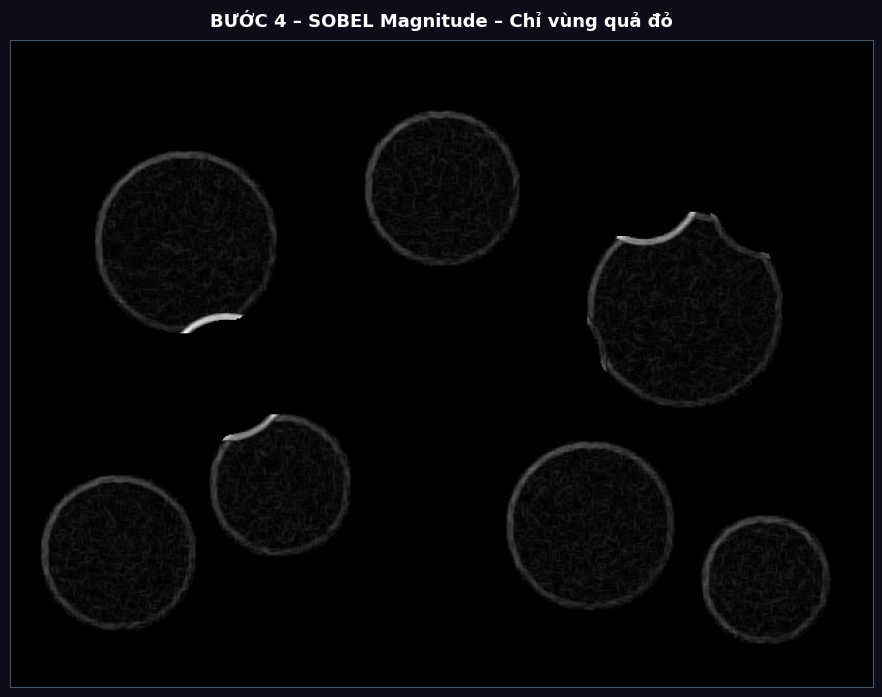

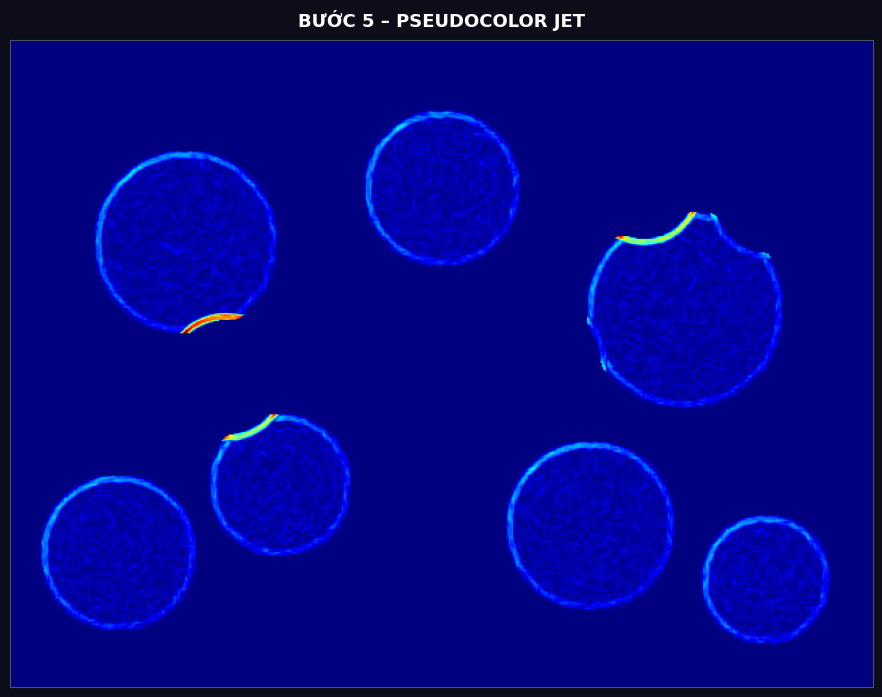

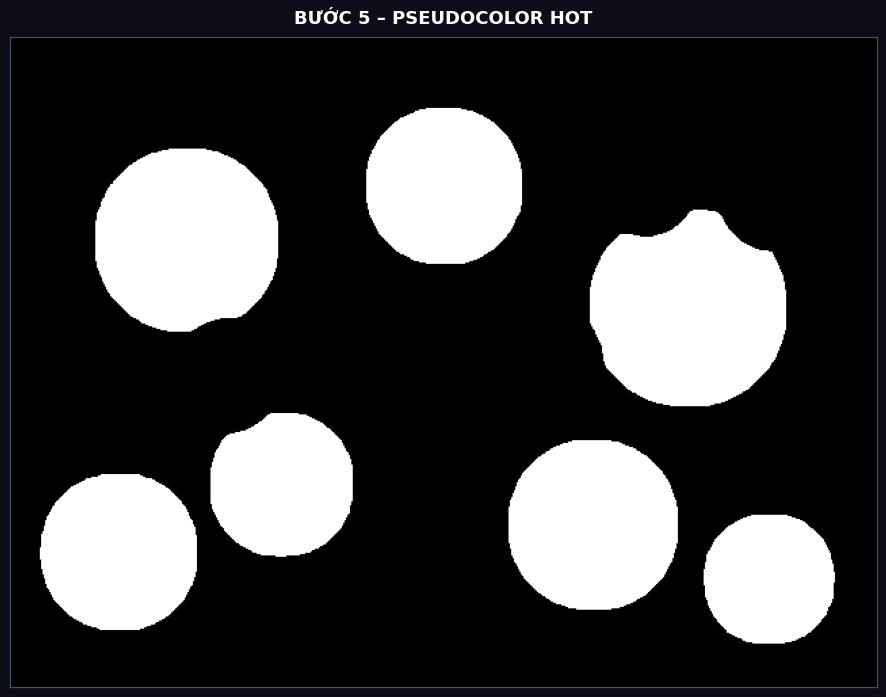

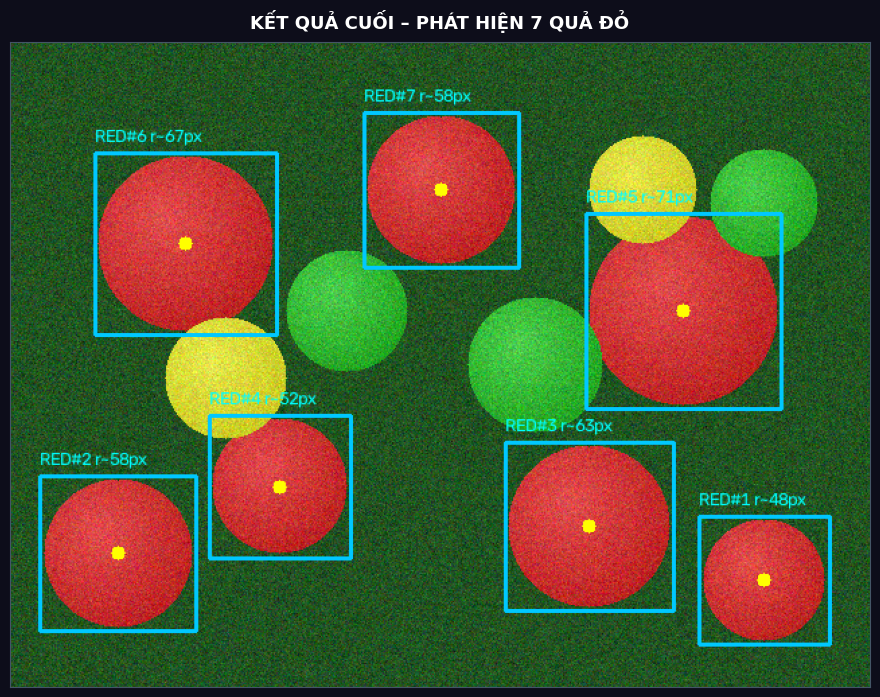


Hoàn tất! Phát hiện 7/7 quả đỏ.


In [20]:
# Nhận diện quả có màu đỏ:

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2
BG = "#0d0d1a"
# 0: Tạo ảnh tổng hợp
np.random.seed(42)
H, W = 480, 640
scene = np.full((H, W, 3), [34, 85, 34], dtype=np.uint8)
for row in range(H):
    scene[row] = np.clip(
        scene[row].astype(int) + np.random.randint(-8, 8, (W, 3)),
        0, 255
    ).astype(np.uint8)
def draw_fruit(img, cx, cy, r, color_bgr):
    Y, X = np.ogrid[:H, :W]
    mask = np.sqrt((X-cx)**2 + (Y-cy)**2) <= r
    ld   = np.sqrt((X-(cx-r*0.25))**2 + (Y-(cy-r*0.3))**2)
    lf   = np.clip(1.0 - ld/(r*1.5), 0, 1)
    for c in range(3):
        img[:,:,c] = np.where(mask,
            np.clip(color_bgr[c]*(1-lf*0.6) + min(color_bgr[c]+80,255)*lf*0.6, 0, 255),
            img[:,:,c]).astype(np.uint8)
red_fruits    = [(130,150,65),(320,110,55),(500,200,70),
                 (200,330,50),(430,360,60),(560,400,45),(80,380,55)]
green_fruits  = [(390,240,50),(250,200,45),(560,120,40)]
yellow_fruits = [(160,250,45),(470,110,40)]
for cx,cy,r in red_fruits:
    draw_fruit(scene, cx, cy, r, [30,30,185])
    cv2.line(scene, (cx,cy-r), (cx+6,cy-r-15), (20,80,20), 2)
for cx,cy,r in green_fruits:
    draw_fruit(scene, cx, cy, r, [30,160,30])
for cx,cy,r in yellow_fruits:
    draw_fruit(scene, cx, cy, r, [30,200,200])
img_original = np.clip(
    scene.astype(np.int16) + np.random.normal(0,18,scene.shape).astype(np.int16),
    0, 255
).astype(np.uint8)
# 1: Averaging Filter
# g(x,y) = [1/25] · Σ f(x+s, y+t)
kernel_avg = np.ones((5,5), np.float32) / 25
img_avg    = cv2.filter2D(img_original, -1, kernel_avg)
# 2: Color Slicing
img_hsv    = cv2.cvtColor(img_avg, cv2.COLOR_BGR2HSV)
mask_red1  = cv2.inRange(img_hsv, np.array([0,  80,50]), np.array([10, 255,255]))
mask_red2  = cv2.inRange(img_hsv, np.array([170,80,50]), np.array([180,255,255]))
mask_slice = cv2.bitwise_or(mask_red1, mask_red2)
# 3: Thresholding
sat_ch     = img_hsv[:,:,1]
sat_masked = cv2.bitwise_and(sat_ch, sat_ch, mask=mask_slice)
_, mask_th = cv2.threshold(sat_masked, 80, 255, cv2.THRESH_BINARY)
kernel_m   = np.ones((7,7), np.uint8)
mask_clean = cv2.dilate(mask_th, kernel_m, iterations=2)
mask_clean = cv2.erode(mask_clean, kernel_m, iterations=1)
# 4: Sobel
gray      = cv2.cvtColor(img_avg, cv2.COLOR_BGR2GRAY)
sobel_x   = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y   = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_mag = np.sqrt(sobel_x**2 + sobel_y**2).clip(0,255).astype(np.uint8)
sobel_red = cv2.bitwise_and(sobel_mag, sobel_mag, mask=mask_clean)
# 5: Pseudocolor
pseudo_jet = cv2.applyColorMap(sobel_red,  cv2.COLORMAP_JET)
pseudo_hot = cv2.applyColorMap(mask_clean, cv2.COLORMAP_HOT)
# Kết quả
result_img  = img_original.copy()
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
count = 0
for cnt in contours:
    if cv2.contourArea(cnt) > 800:
        x, y, w, h_b = cv2.boundingRect(cnt)
        cx_d, cy_d   = x+w//2, y+h_b//2
        r_e          = int(np.sqrt(cv2.contourArea(cnt)/np.pi))
        cv2.rectangle(result_img, (x,y), (x+w,y+h_b), (255,200,0), 2)
        cv2.circle(result_img, (cx_d,cy_d), 5, (0,255,255), -1)
        cv2.putText(result_img, f"RED#{count+1} r~{r_e}px",
                    (x,y-8), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (255,255,0), 1)
        count += 1
def show(img, title, subtitle="", is_gray=False, cmap=None):
    """Hiển thị 1 ảnh đơn trong Colab."""
    fig, ax = plt.subplots(figsize=(9, 7), facecolor=BG)
    ax.set_facecolor(BG)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    for sp in ax.spines.values():
        sp.set_edgecolor("#445566")
    if is_gray or cmap:
        ax.imshow(img, cmap=cmap or "gray", vmin=0, vmax=255)
    else:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(title,     color="white",   fontsize=13, fontweight="bold", pad=10)
    ax.set_xlabel(subtitle, color="#aaaacc", fontsize=9.5, labelpad=6)
    plt.tight_layout()
    plt.show()
def show_hist():
    fig, ax = plt.subplots(figsize=(9, 6), facecolor=BG)
    ax.set_facecolor(BG)
    for sp in ax.spines.values(): sp.set_edgecolor("#445566")
    ax.tick_params(colors="#aaaacc")
    r0 = img_original[:,:,2].ravel()
    r1 = img_avg[:,:,2].ravel()
    ax.hist(r0, bins=100, alpha=0.65, color="#ff6b6b", density=True,
            label=f"Trước lọc  (std={r0.std():.1f})")
    ax.hist(r1, bins=100, alpha=0.75, color="#26c6da", density=True,
            label=f"Sau lọc    (std={r1.std():.1f})")
    ax.set_title("Histogram kênh R – Trước/Sau Averaging Filter",
                 color="white", fontsize=13, fontweight="bold")
    ax.set_xlabel("Mức xám r", color="#aaaacc", fontsize=10)
    ax.set_ylabel("Mật độ",    color="#aaaacc", fontsize=10)
    ax.legend(fontsize=10, facecolor="#1a1a2e", labelcolor="white")
    plt.tight_layout()
    plt.show()
def show_kernel():
    fig, ax = plt.subplots(figsize=(6, 6), facecolor=BG)
    ax.set_facecolor(BG)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    ax.imshow(np.ones((5,5)), cmap="Blues", vmin=0, vmax=2)
    for i in range(5):
        for j in range(5):
            ax.text(j, i, "1/25", ha="center", va="center",
                    fontsize=14, color="white", fontweight="bold")
    ax.set_title("Kernel Averaging 5×5",
                 color="white", fontsize=13, fontweight="bold", pad=10)
    ax.set_xlabel("",
                  color="#aaaacc", fontsize=9.5, labelpad=6)
    plt.tight_layout()
    plt.show()
show(img_original,
     "BƯỚC 0 – ẢNH GỐC CÓ NHIỄU")
show(img_avg,
     "BƯỚC 1 – AVERAGING FILTER 5×5")
show_hist()
show_kernel()
show(img_hsv[:,:,0], "BƯỚC 2 – KÊNH H (Hue) – Không gian HSV", is_gray=True, cmap="hsv")
show(mask_slice, "BƯỚC 2 – COLOR SLICING", is_gray=True)
show(mask_th, "BƯỚC 3 – THRESHOLDING", is_gray=True)
show(mask_clean, "BƯỚC 3 – THRESHOLDING – Sau làm sạch", is_gray=True)
show(np.abs(sobel_x).clip(0,255).astype(np.uint8), "BƯỚC 4 – SOBEL Gx", is_gray=True)
show(np.abs(sobel_y).clip(0,255).astype(np.uint8), "BƯỚC 4 – SOBEL Gy  (Ch.3 §2.7)", is_gray=True)
show(sobel_red,"BƯỚC 4 – SOBEL Magnitude – Chỉ vùng quả đỏ", is_gray=True)
show(pseudo_jet, "BƯỚC 5 – PSEUDOCOLOR JET")
show(pseudo_hot, "BƯỚC 5 – PSEUDOCOLOR HOT")
show(result_img, f"KẾT QUẢ CUỐI – PHÁT HIỆN {count} QUẢ ĐỎ")
print(f"\nHoàn tất! Phát hiện {count}/7 quả đỏ.")